In [1]:
import cv2
import numpy as np
import dlib
import matplotlib.pyplot as plt


ModuleNotFoundError: No module named 'nbimporter'

In [10]:
img = cv2.imread("imagens/px-woman-smilings.jpg")
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
img_color = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

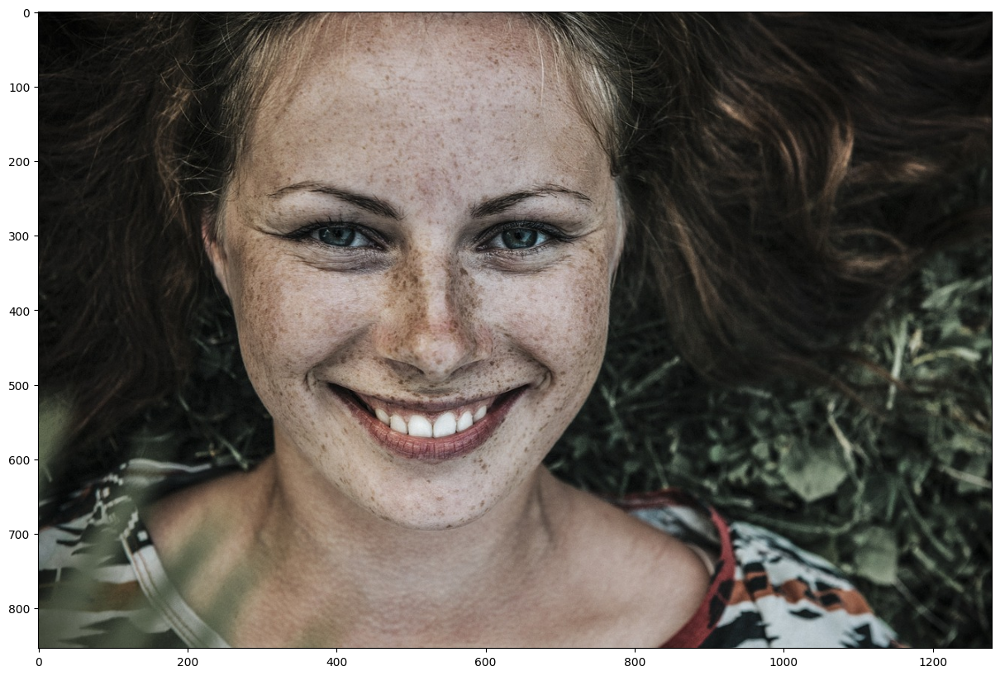

In [20]:
plt.figure(figsize=(20, 10))
plt.imshow(img_color)

In [15]:
class_dlib_68_path = "classificadores/shape_predictor_68_face_landmarks.dat"
class_dlib_68 = dlib.shape_predictor(class_dlib_68_path)
detect_face = dlib.get_frontal_face_detector()

In [41]:
def set_rectangle(img, color=(0, 255, 0)):
    detect_other_faces = 1
    faces = detect_face(img, detect_other_faces)
    for face in faces:
        x, y, l, a = (int(face.left()), int(face.top()), int(face.right()), int(face.bottom()))
        cv2.rectangle(img, (x, y), (l, a), color, 2)
        print(f'Detect face: {x, y, l, a}')
    return img

def get_face_marco(img):
    detect_other_faces = 1
    rectangles = detect_face(img, detect_other_faces)
    marcos = []
    for rectangle in rectangles:
        marcos.append(np.matrix([
            [p.x, p.y] for p in class_dlib_68(img, rectangle).parts()
        ]))
    return marcos

def set_anothers_points(img, marcos, color=(0, 255, 0)):
    for marco in marcos:
        for idx, point in enumerate(marco):
            pos = (point[0, 0], point[0, 1])
            cv2.circle(img, pos, 3, color, -1)
            cv2.putText(img, str(idx), pos, cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1)
    return img

Detect face: (233, 172, 788, 726)


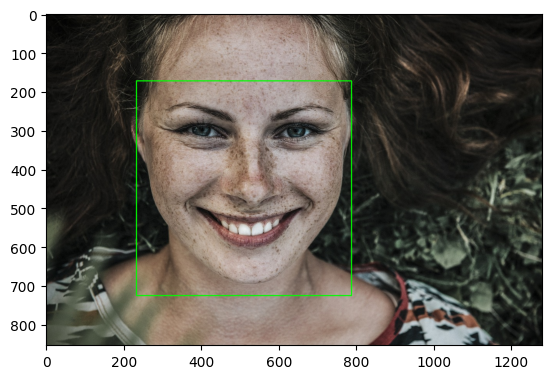

In [19]:
anothed_img = img_color.copy()
anothed_img = set_rectangle(anothed_img)
plt.imshow(anothed_img)

In [40]:
img_marcos = get_face_marco(img_color.copy())
len(img_marcos), len(img_marcos[0])

(1, 68)

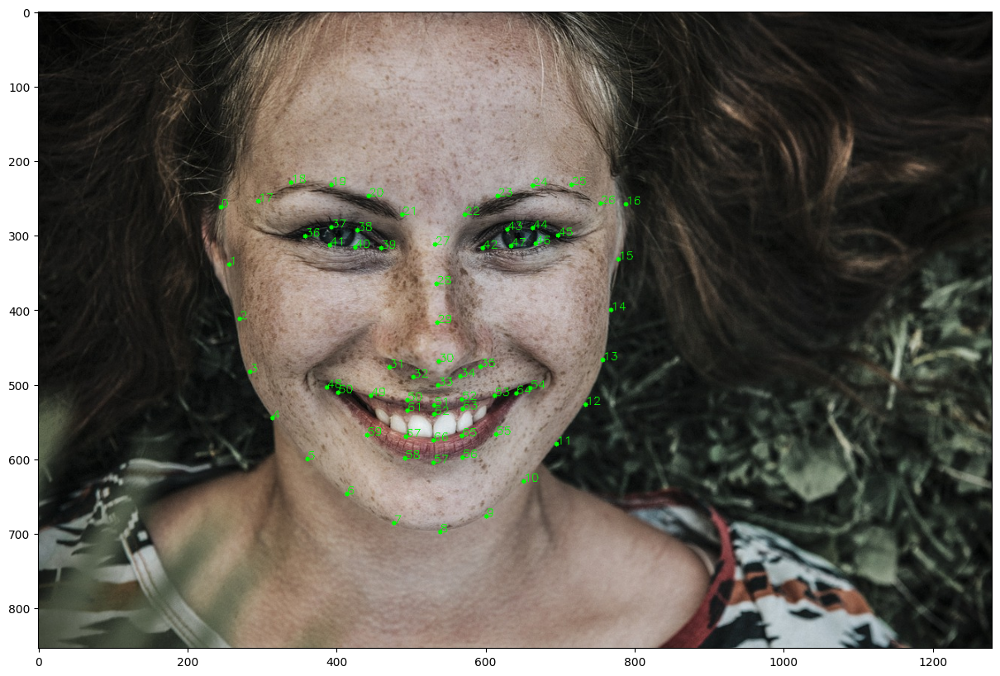

In [43]:
plt.figure(figsize=(20, 10))
anothed_img = set_anothers_points(img_color.copy(), img_marcos)
plt.imshow(anothed_img)

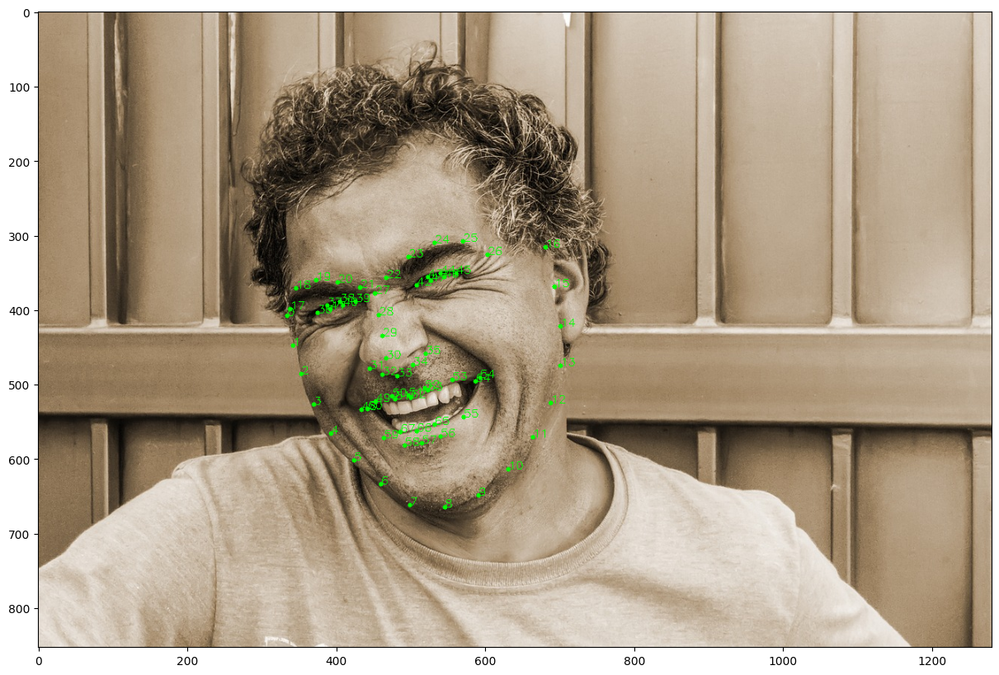

In [48]:
img = cv2.imread("imagens/px-man-happy.jpg")
img_color = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

img_marcos = get_face_marco(img_color.copy())
anothed_img = set_anothers_points(img_color.copy(), img_marcos)

plt.figure(figsize=(20, 10))
plt.imshow(anothed_img)

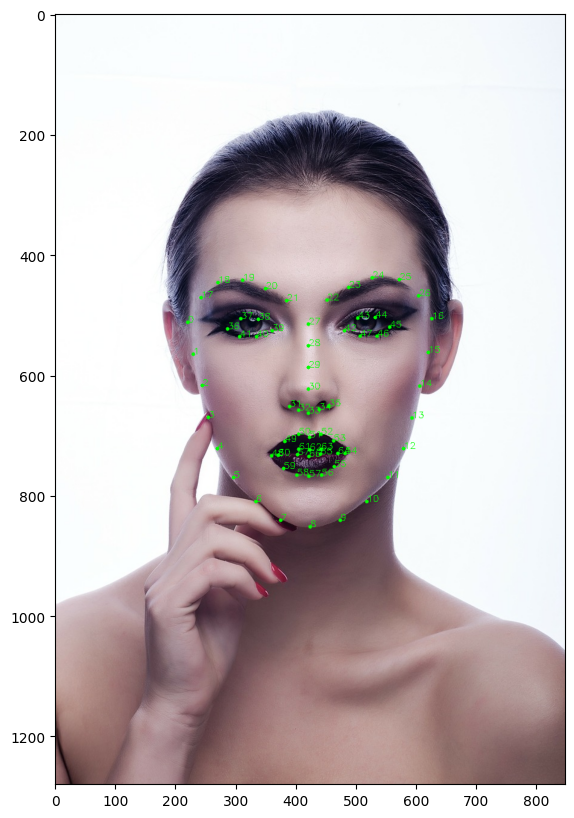

In [50]:
img = cv2.imread("imagens/px-girl-front.jpg")
img_color = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

img_marcos = get_face_marco(img_color.copy())
anothed_img = set_anothers_points(img_color.copy(), img_marcos)

plt.figure(figsize=(20, 10))
plt.imshow(anothed_img)

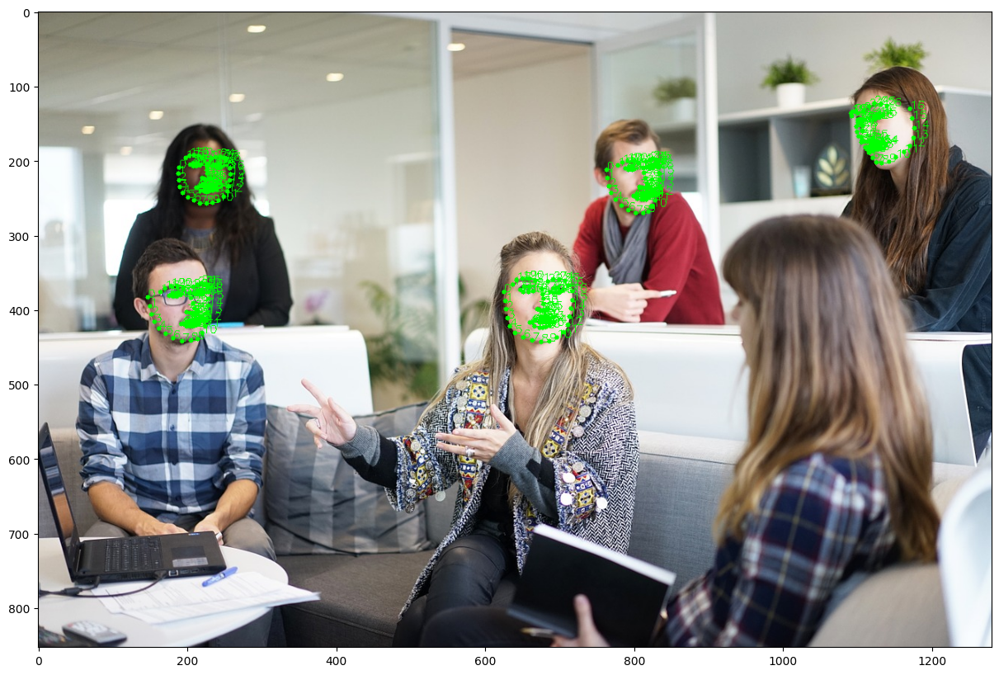

In [52]:
img = cv2.imread("imagens/px-people.jpg")
img_color = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

img_marcos = get_face_marco(img_color.copy())
anothed_img = set_anothers_points(img_color.copy(), img_marcos)

plt.figure(figsize=(20, 10))
plt.imshow(anothed_img)

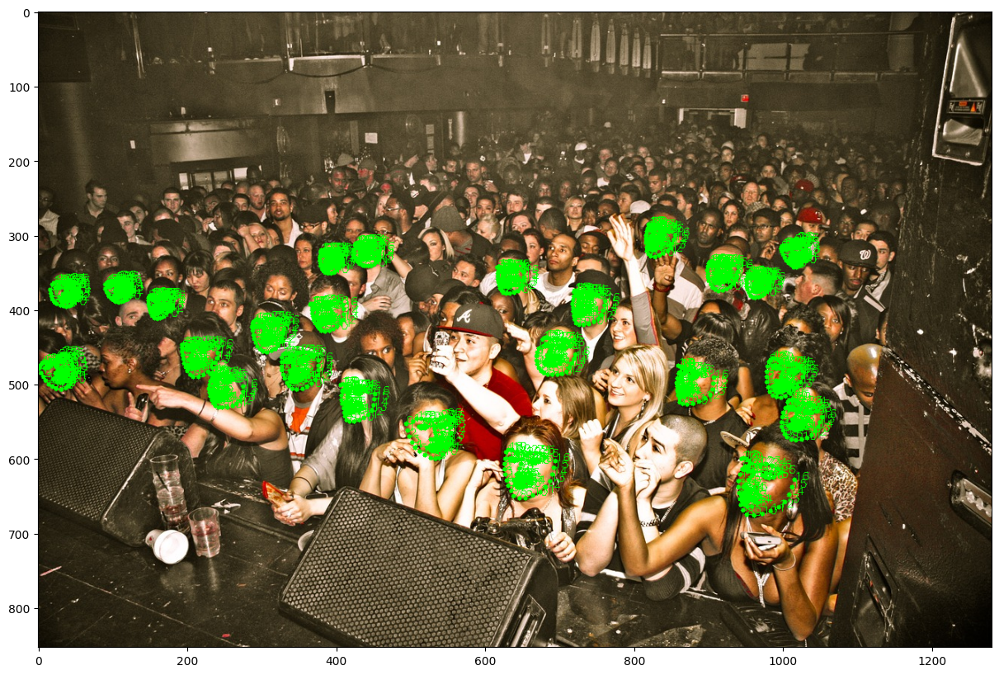

In [53]:
img = cv2.imread("imagens/px-show.jpg")
img_color = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

img_marcos = get_face_marco(img_color.copy())
anothed_img = set_anothers_points(img_color.copy(), img_marcos)

plt.figure(figsize=(20, 10))
plt.imshow(anothed_img)